# 数字图像处理第六次作业

赵子瑞　自动化钱61　2160405068

## 摘要

本次作业主要包括图像噪声，利用空间滤波的图像恢复和重建，维纳滤波的推导和性质讨论。实验中，通过python实现了高斯噪声和椒盐噪声，通过自行实现均值滤波器、统计排序滤波器，以及自适应滤波器，分别对不同噪声进行图像恢复和重建。
通过本次实验，我掌握了很多珍贵的知识。

## Assignments 

本次实验的任务为一下几个部分
* 在测试图像上产生高斯噪声lena图-需能指定均值和方差；并用多种滤波器恢复图像，分析各自优缺点；
* 在测试图像lena图加入椒盐噪声（椒和盐噪声密度均是0.1）；用学过的滤波器恢复图像；在使用反谐波分析Q大于0和小于0的作用；
* 推导维纳滤波器并实现下边要求:

    * 实现模糊滤波器如方程Eq. (5.6-11).
    * 模糊lena图像：45度方向，T=1；
    * 再模糊的lena图像中增加高斯噪声，均值= 0 ，方差=10 pixels 以产生模糊图像；
    * 分别利用方程 Eq. (5.8-6)和(5.9-4)，恢复图像；并分析算法的优缺点.

## Task 1

### Gaussian Noise

The PDF of Gaussian distribution Noise is shown below.

$$p(z) = \frac{1}{\sqrt{2\pi}\sigma}e^{-(z-\overline{z}/2\sigma^2)}$$

首先在lena图片上实现高斯噪声，我们通过不同的均值和方差，来实现对图像的噪声控制。

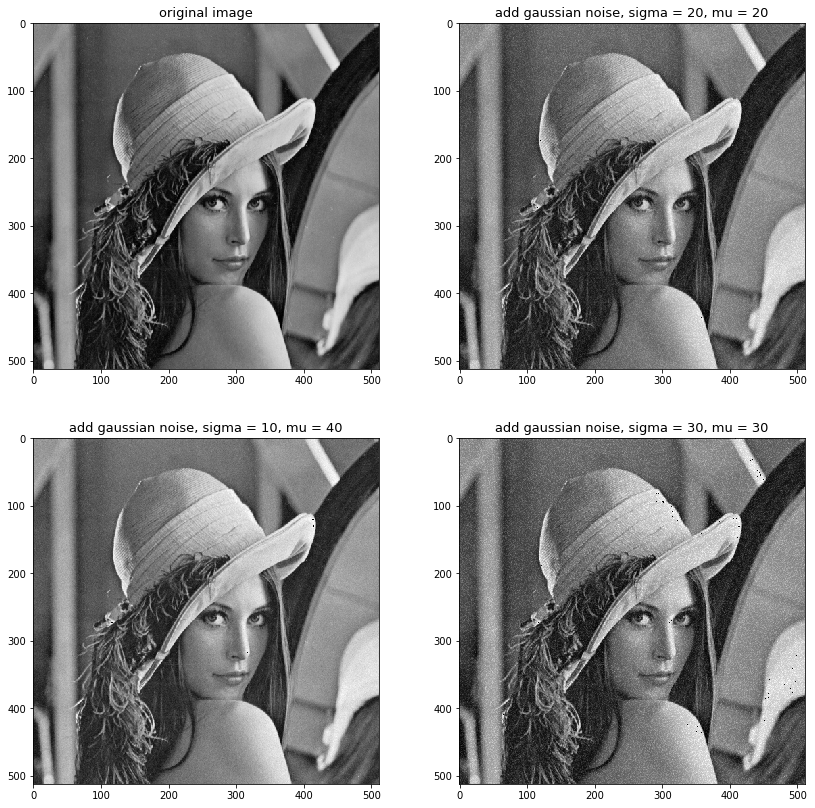

In [2]:
import sys
import os
lib_path = os.path.abspath(os.path.join(sys.path[0], '..'))
sys.path.append(lib_path)
from src.basic_cv_tool import *

image_name = '../../homework6/project6/lena.bmp'

def draw(img, img1, img2, img3):
    plt.figure(figsize = (14,14))
    p = plt.subplot(221)
    p.set_title('original image', fontsize = 13)
    p.imshow(img,cmap = 'gray')
    p1 = plt.subplot(222)
    p1.set_title('add gaussian noise, sigma = 20, mu = 20', fontsize = 13)
    p1.imshow(img1,cmap='gray')
    p2 = plt.subplot(223)
    p2.set_title('add gaussian noise, sigma = 10, mu = 40', fontsize = 13)
    p2.imshow(img2,cmap='gray')
    p3 = plt.subplot(224)
    p3.set_title('add gaussian noise, sigma = 30, mu = 30', fontsize = 13)
    p3.imshow(img3,cmap='gray')

tool = basic_cv_tool(image_name)
img = tool.ImageRead(image_name)
img1 = tool.Gaussian_Noise_generator(img.copy(), 20, 20, 0.5)
img2 = tool.Gaussian_Noise_generator(img.copy(), 10, 40, 0.5)
img3 = tool.Gaussian_Noise_generator(img.copy(), 30, 20, 0.5)
draw(img, img1, img2, img3)

我们设计了多种多样的滤波器，通过相应的滤波器，可以得到不同的滤波效果。

### Mean Filters

#### Arithmetic mean filter

这是最简单的均值滤波器。其公式如下。

$$\widehat{f}(x,y) = \frac{1}{mn}\sum_{(s,t)\in{S_{x,y}}}g(s,t)$$

用算数均值滤波器处理一下有噪声的图片，效果如下。

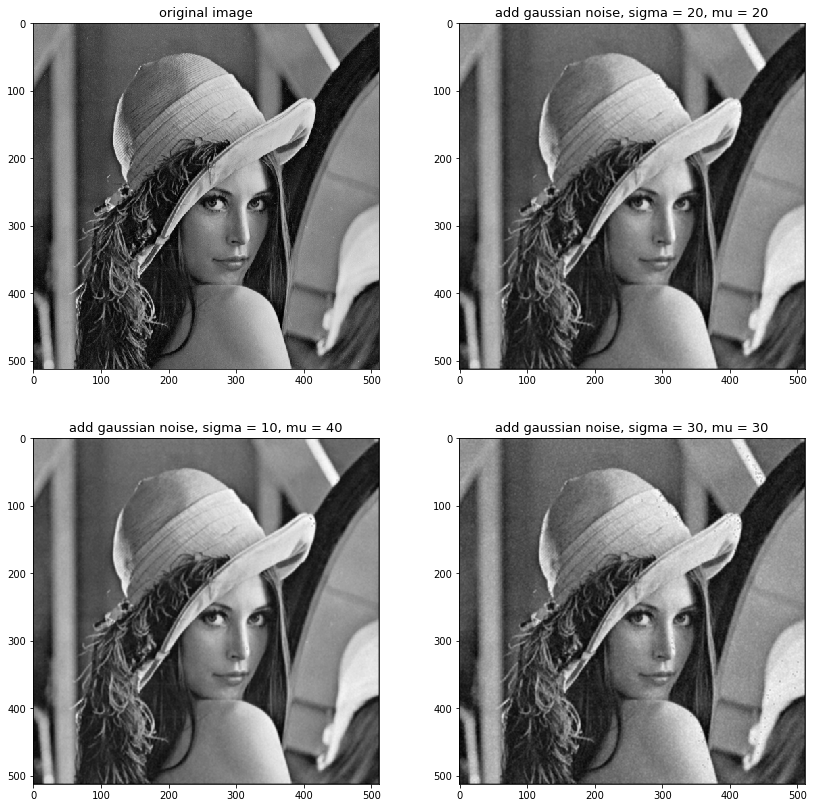

In [2]:
img4 = tool.meanFilter(img1, 3, 3)
img5 = tool.meanFilter(img2, 3, 3)
img6 = tool.meanFilter(img3, 3, 3)
draw(img, img4, img5, img6)

#### Geometric mean filter

几何均值滤波器，公式如下。

$$\widehat{f}(x,y) = \left[\prod_{(s,t)\in{S_{x,y}}}g(s,t)\right]^{\frac{1}{mn}}$$

其处理效果如下

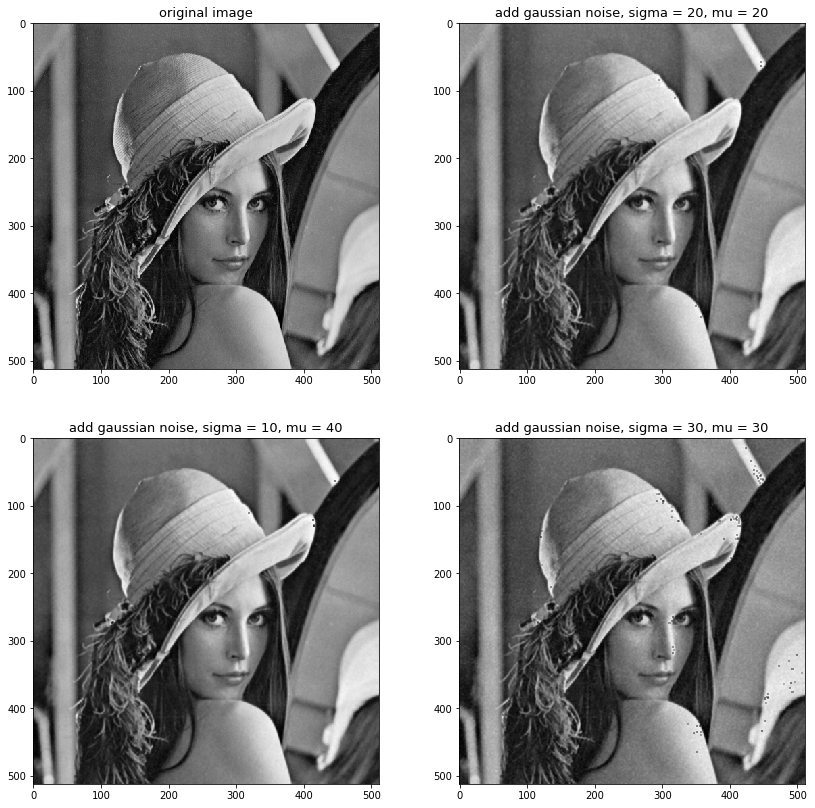

In [3]:
img7 = tool.geo_meanFilter(img1.copy(), 3, 3)
img8 = tool.geo_meanFilter(img2.copy(), 3, 3)
img9 = tool.geo_meanFilter(img3.copy(), 3, 3)
draw(img, img7, img8, img9)

#### Harmonic mean filter

$$\widehat{f}(x,y) = \frac{mn}{\sum_{(s,t)\in S_{x,y}} g(s,t)}$$

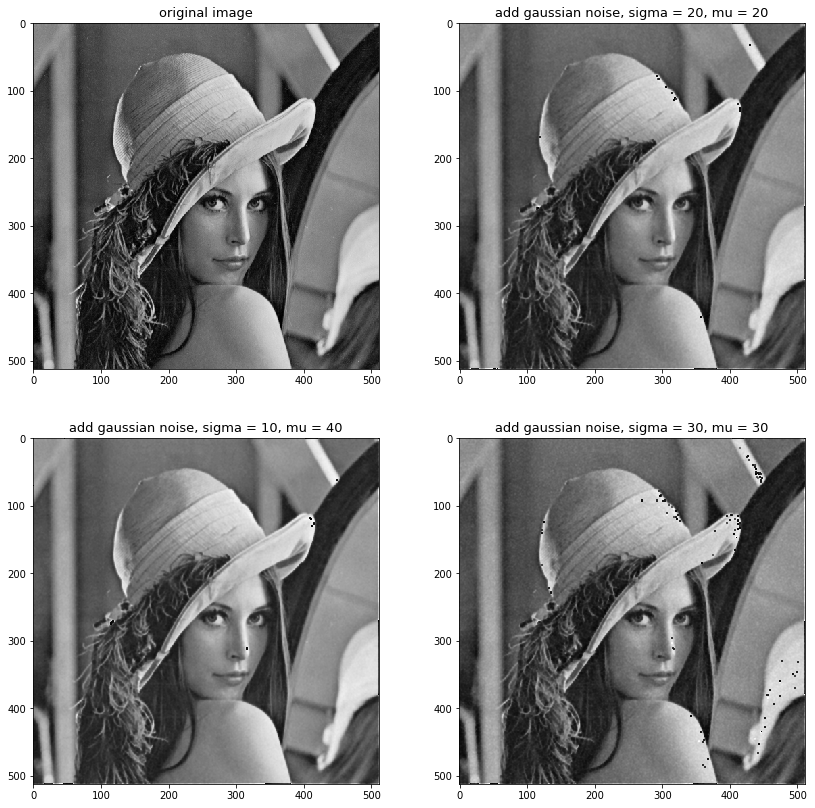

In [4]:
img7 = tool.har_meanFilter(img1.copy(), 3, 3)
img8 = tool.har_meanFilter(img2.copy(), 3, 3)
img9 = tool.har_meanFilter(img3.copy(), 3, 3)
draw(img, img7, img8, img9)

#### Contraharmonic mean filter

$$\widehat{f}(x,y) = \frac{\sum_{(s,t)\in S_{x,y}} g(s,t)^{Q+1}}{\sum_{(s,t)\in S_{x,y}} g(s,t)^{Q}}$$

Q = 1


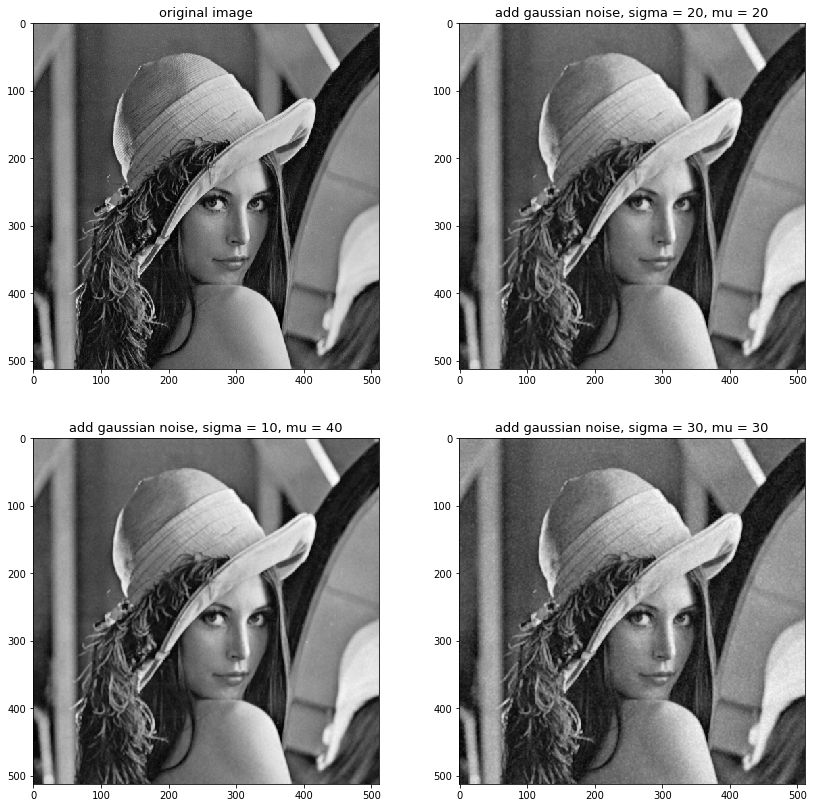

In [5]:
img7 = tool.contraharm_meanFilter(img1.copy(), 3, 3, 1)
img8 = tool.contraharm_meanFilter(img2.copy(), 3, 3, 1)
img9 = tool.contraharm_meanFilter(img3.copy(), 3, 3, 1)
draw(img, img7, img8, img9)

### Order-Statistic Filters

#### Medium Filter

$$\widehat{f}(x,y) = median_{(s,t)\in{S_{xy}}}\{g(x,y)\}$$

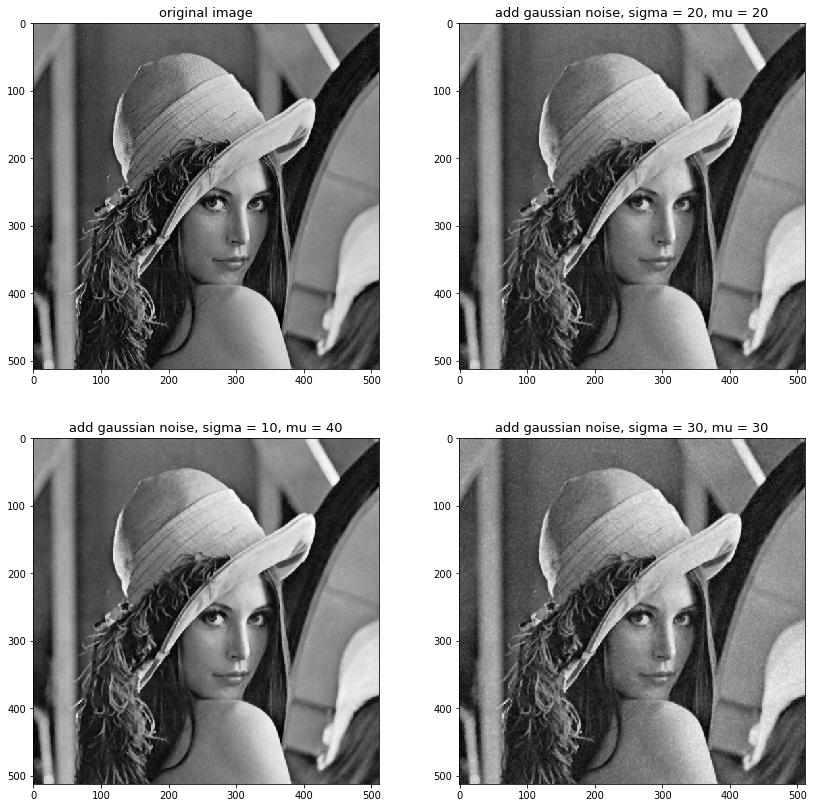

In [6]:
img7 = tool.MediumFilter(img1.copy(), 3)
img8 = tool.MediumFilter(img2.copy(), 3)
img9 = tool.MediumFilter(img3.copy(), 3)
draw(img, img7,img8, img9)

#### Max filter

$$\widehat{f}(x,y) = max_{(s,t)\in{S_{xy}}}\{g(x,y)\}$$

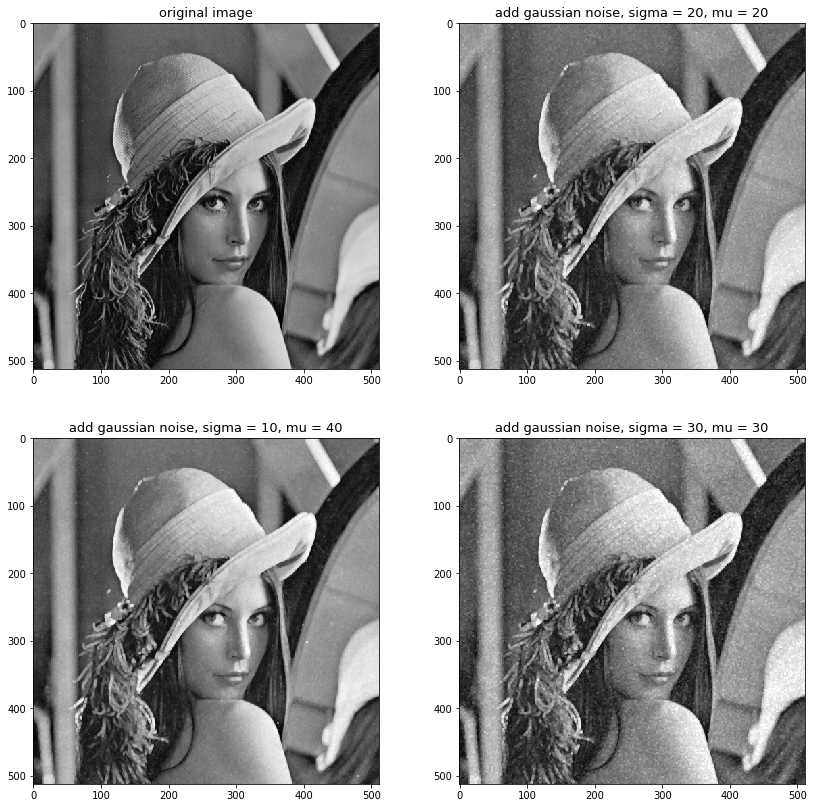

In [7]:
img7 = tool.maxFilter(img1.copy(), 3, 3)
img8 = tool.maxFilter(img2.copy(), 3, 3)
img9 = tool.maxFilter(img3.copy(), 3, 3)
draw(img, img7, img8, img9)

#### Min filter

$$\widehat{f}(x,y) = min_{(s,t)\in{S_{xy}}}\{g(x,y)\}$$

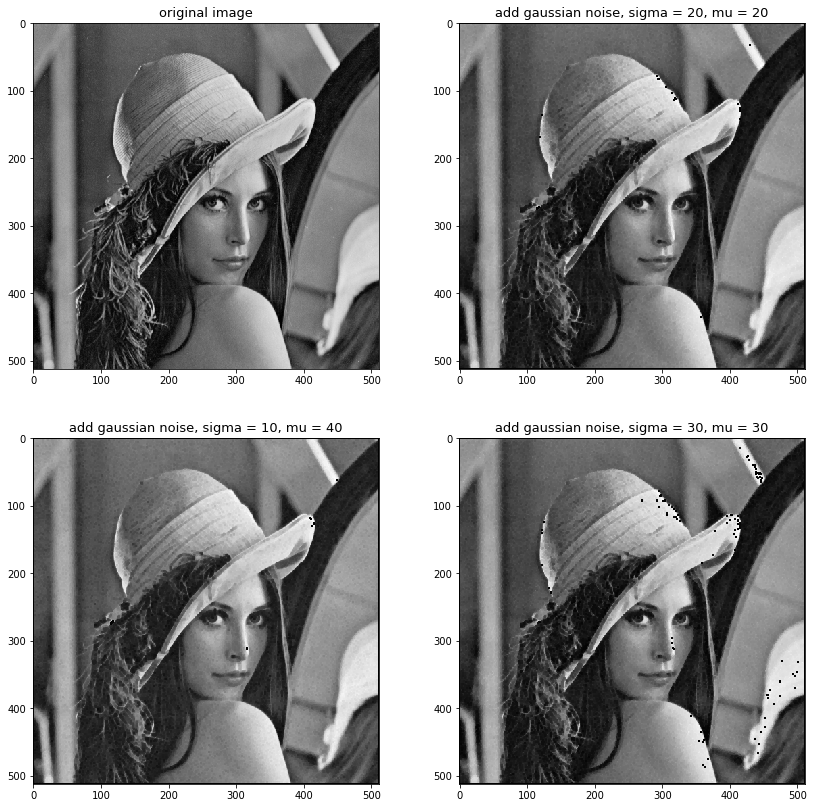

In [8]:
img7 = tool.minFilter(img1.copy(), 3, 3)
img8 = tool.minFilter(img2.copy(), 3, 3)
img9 = tool.minFilter(img3.copy(), 3, 3)
draw(img, img7, img8, img9)

#### Mid filter

$$\widehat{f}(x,y) = \frac{1}{2}\left[max_{(s,t)\in{S_{xy}}}\{g(x,y)\} + min_{(s,t)\in{S_{xy}}}\{g(x,y)\}\right]$$

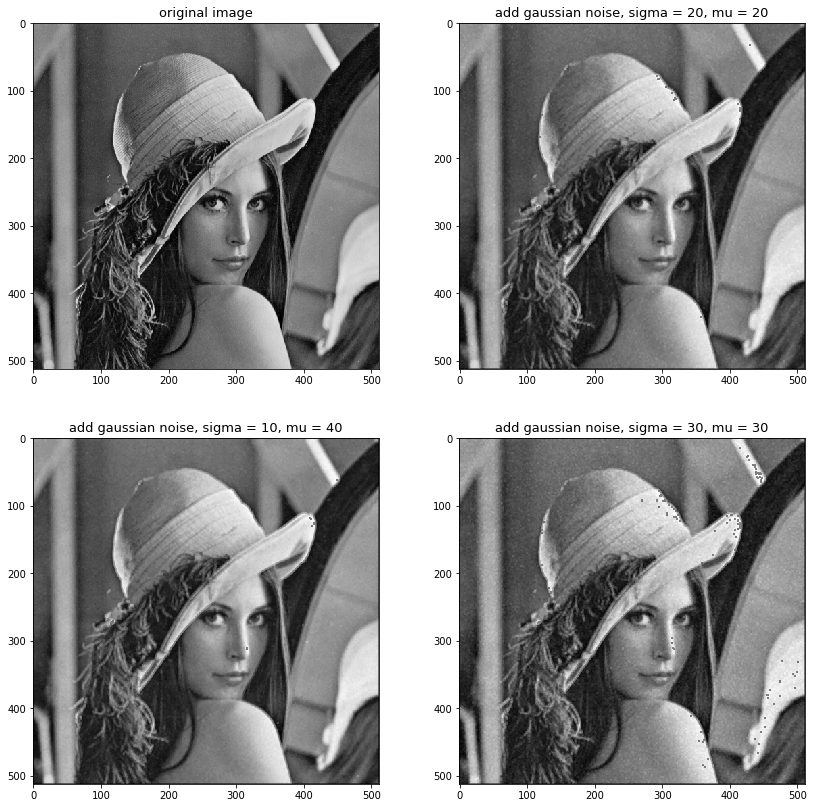

In [9]:
img7 = tool.midFilter(img1.copy(), 3, 3)
img8 = tool.midFilter(img2.copy(), 3, 3)
img9 = tool.midFilter(img3.copy(), 3, 3)
draw(img, img7, img8, img9)

#### Alpha-trimmed mean filter

$$\widehat{f}(x,y) = \frac{1}{mn-d}\sum_{(s,t)\in{S_{xy}}}{g_r(s,t)}$$

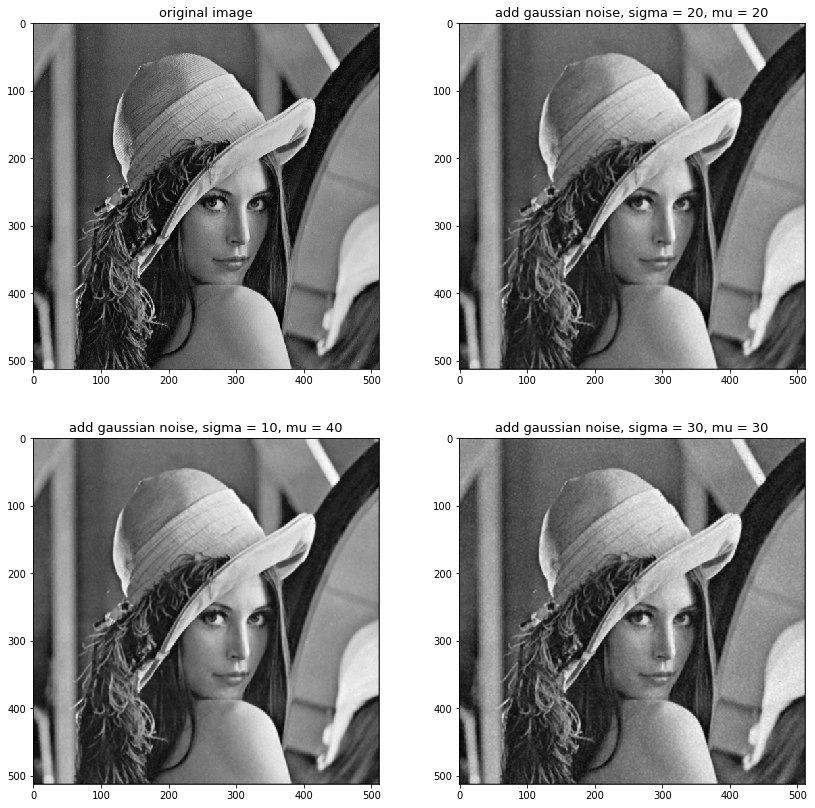

In [10]:
img7 = tool.fixed_alpha_meanFilter(img1.copy(), 3, 3, 2)
img8 = tool.fixed_alpha_meanFilter(img2.copy(), 3, 3, 2)
img9 = tool.fixed_alpha_meanFilter(img3.copy(), 3, 3, 2)
draw(img, img7, img8, img9)

## Task 2 

### Salt and Pepper Noise

The PDF of salt and pepper noise is shown below.

$$y = \left\{ \begin{array}{ll}
P_a & \textrm{z=a}\\
P_b & \textrm{z=b}\\
1-P_a-P_b & \textrm{others}
\end{array} \right.$$

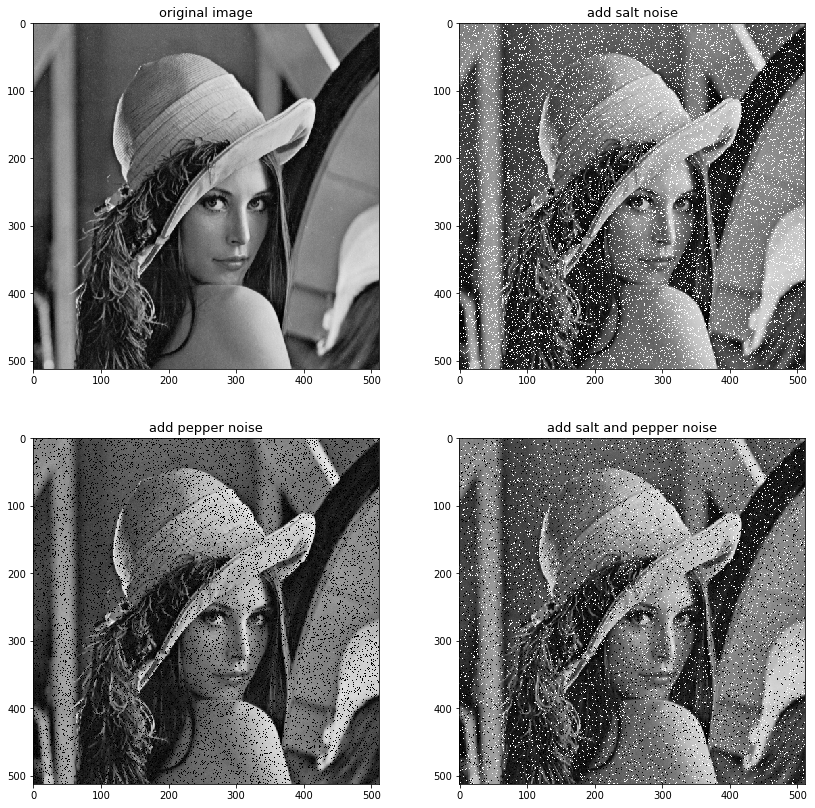

In [11]:
img1 = tool.Salt_Noise_generator(img.copy(), 0.1)
img2 = tool.Pepper_Noise_generator(img.copy(), 0.1)
img3 = tool.Salt_and_Pepper_Noise_generator(img.copy(), 0.1)
def draw2(img, img1, img2, img3):
    plt.figure(figsize = (14,14))
    p = plt.subplot(221)
    p.set_title('original image', fontsize = 13)
    p.imshow(img,cmap = 'gray')
    p1 = plt.subplot(222)
    p1.set_title('add salt noise', fontsize = 13)
    p1.imshow(img1,cmap='gray')
    p2 = plt.subplot(223)
    p2.set_title('add pepper noise', fontsize = 13)
    p2.imshow(img2,cmap='gray')
    p3 = plt.subplot(224)
    p3.set_title('add salt and pepper noise', fontsize = 13)
    p3.imshow(img3,cmap='gray')
draw2(img, img1, img2, img3)

### Mean filter

#### Arithmetic mean filter

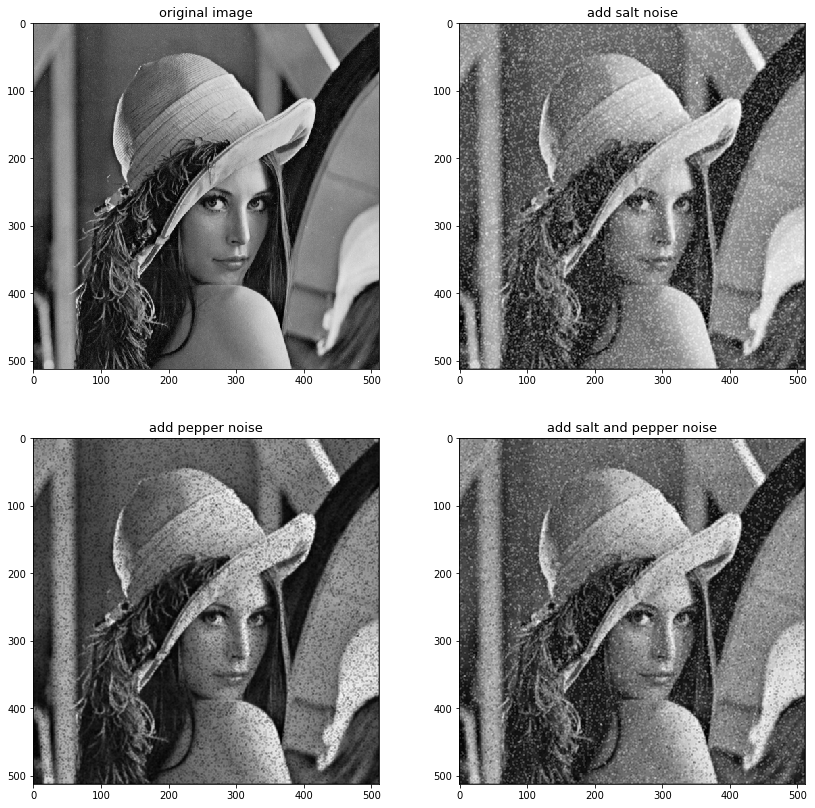

In [12]:
img7 = tool.meanFilter(img1.copy(), 3, 3)
img8 = tool.meanFilter(img2.copy(), 3, 3)
img9 = tool.meanFilter(img3.copy(), 3, 3)
draw2(img, img7, img8, img9)

#### Geometric mean filter

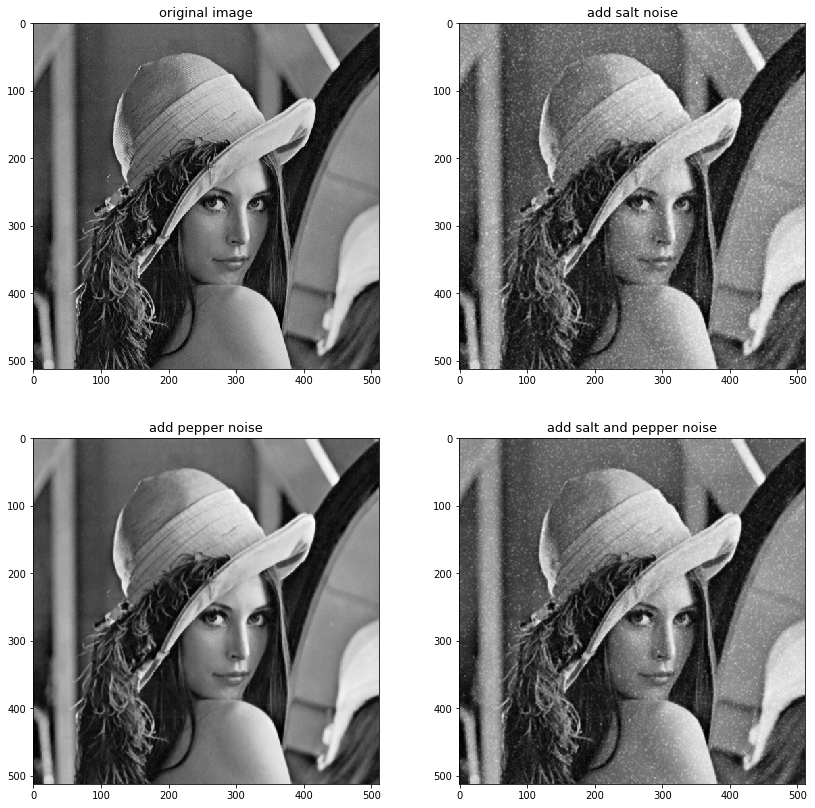

In [13]:
img7 = tool.geo_meanFilter(img1.copy(), 3, 3)
img8 = tool.geo_meanFilter(img2.copy(), 3, 3)
img9 = tool.geo_meanFilter(img3.copy(), 3, 3)
draw2(img, img7, img8, img9)

#### Harmonic mean filter

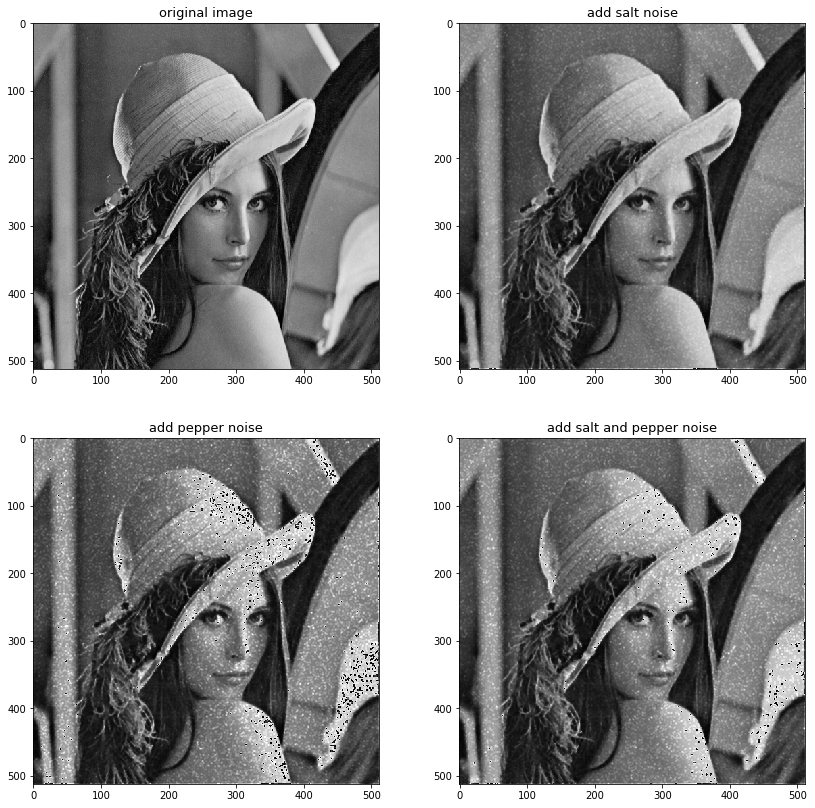

In [16]:
img7 = tool.har_meanFilter(img1.copy(), 3, 3)
img8 = tool.har_meanFilter(img2.copy(), 3, 3)
img9 = tool.har_meanFilter(img3.copy(), 3, 3)
draw2(img, img7, img8, img9)

#### Contraharmonic mean filter

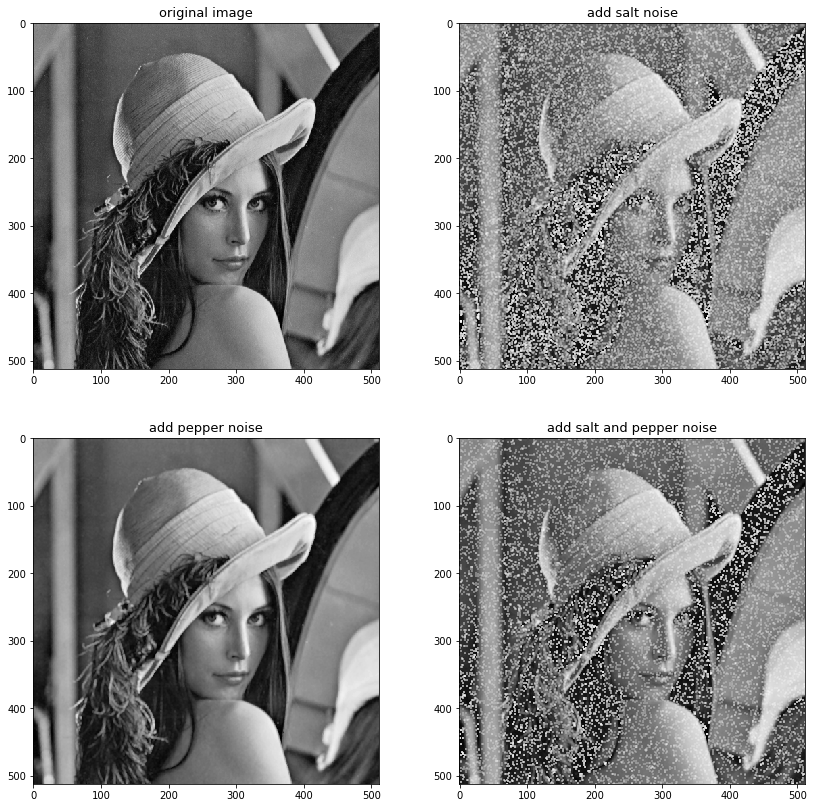

In [17]:
img7 = tool.contraharm_meanFilter(img1.copy(), 3, 3,1)
img8 = tool.contraharm_meanFilter(img2.copy(), 3, 3,1)
img9 = tool.contraharm_meanFilter(img3.copy(), 3, 3,1)
draw2(img, img7, img8, img9)

### Order-Statistics Filter

#### Medium filter

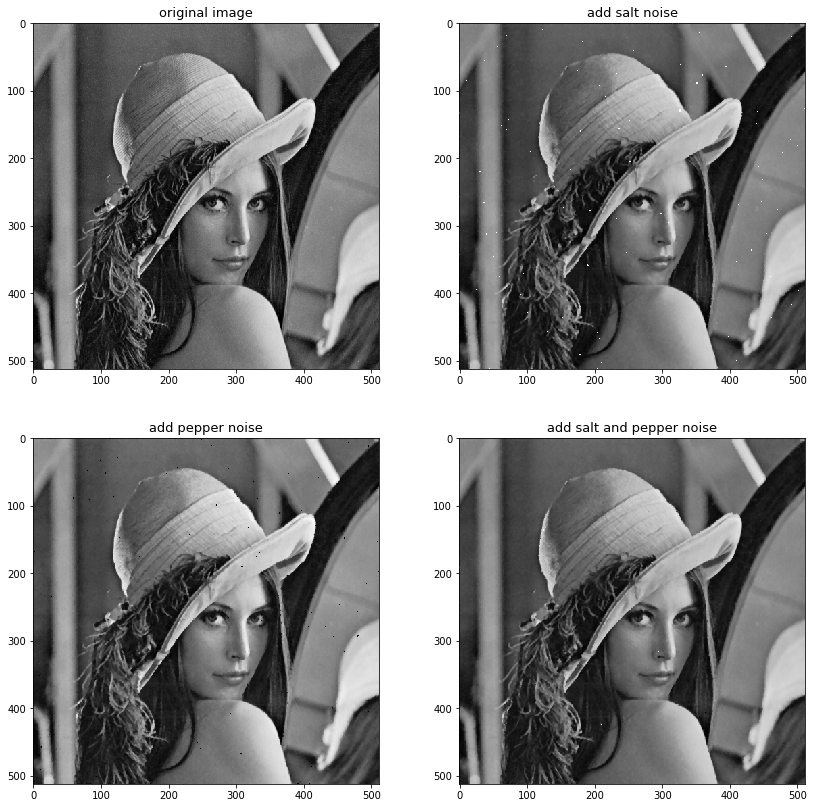

In [19]:
img7 = tool.MediumFilter(img1.copy(), 3)
img8 = tool.MediumFilter(img2.copy(), 3)
img9 = tool.MediumFilter(img3.copy(), 3)
draw2(img, img7, img8, img9)

#### Max filter

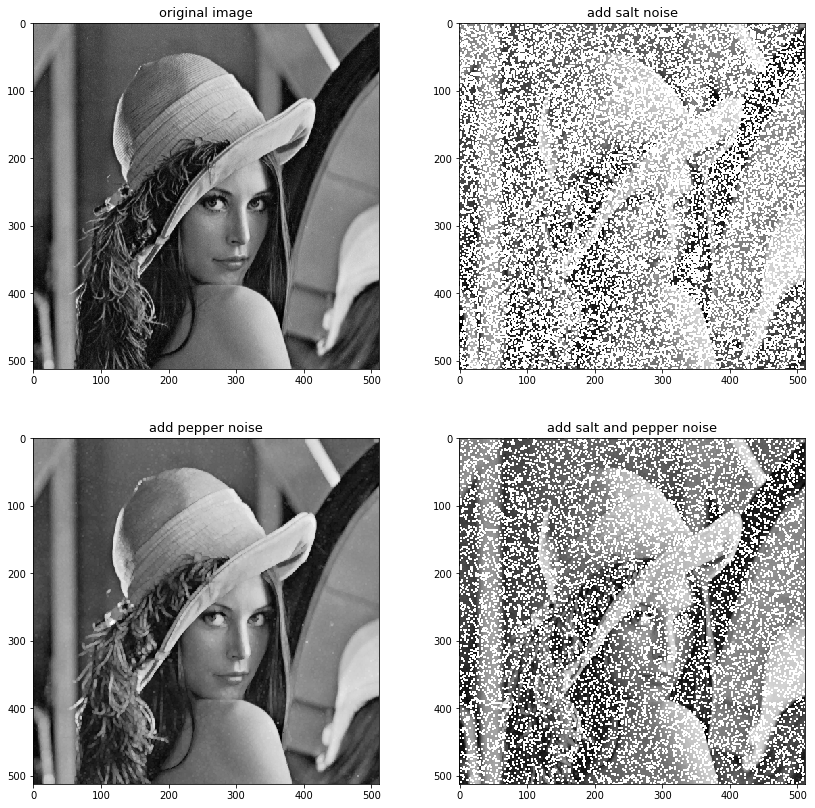

In [20]:
img7 = tool.maxFilter(img1.copy(), 3, 3)
img8 = tool.maxFilter(img2.copy(), 3, 3)
img9 = tool.maxFilter(img3.copy(), 3, 3)
draw2(img, img7, img8, img9)

#### Min filter

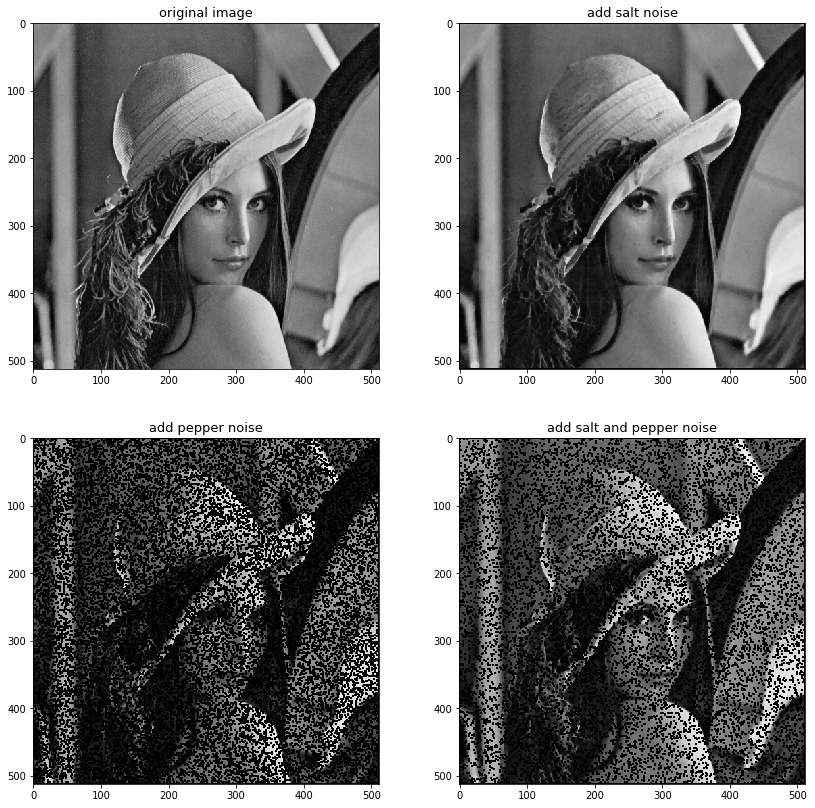

In [21]:
img7 = tool.minFilter(img1.copy(), 3, 3)
img8 = tool.minFilter(img2.copy(), 3, 3)
img9 = tool.minFilter(img3.copy(), 3, 3)
draw2(img, img7, img8, img9)

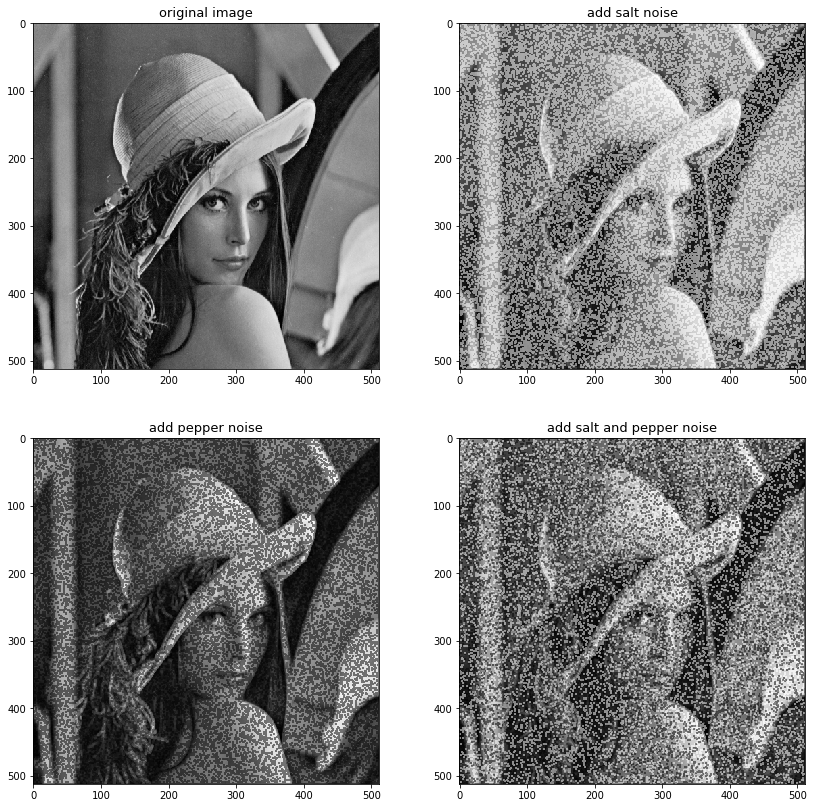

In [22]:
img7 = tool.midFilter(img1.copy(), 3, 3)
img8 = tool.midFilter(img2.copy(), 3, 3)
img9 = tool.midFilter(img3.copy(), 3, 3)
draw2(img, img7, img8, img9)

#### Alpha-trimmed mean filter

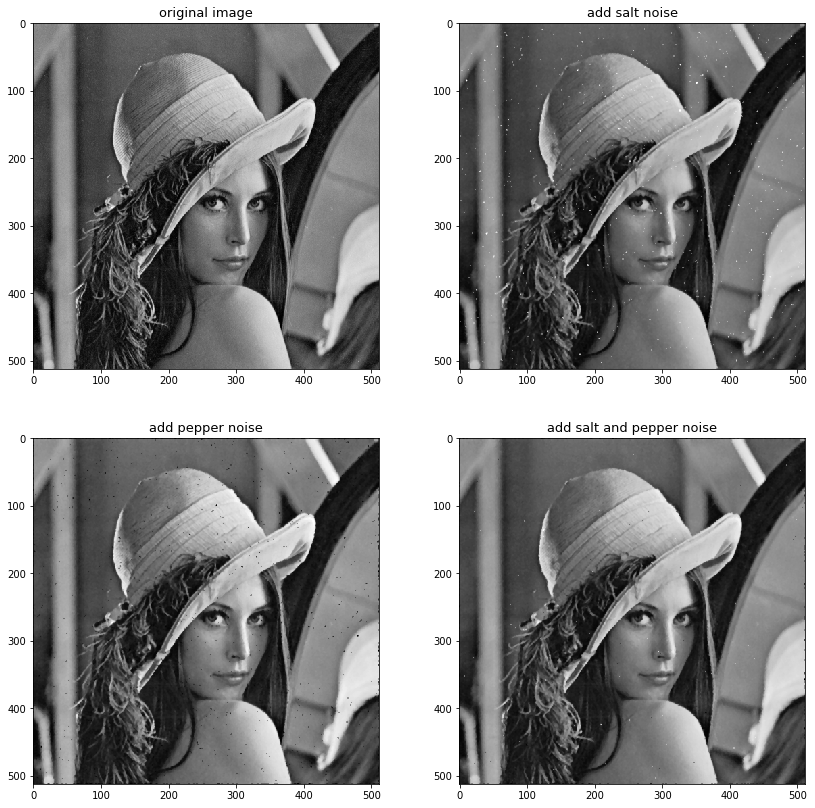

In [26]:
img7 = tool.fixed_alpha_meanFilter(img1.copy(), 3, 3, 6)
img8 = tool.fixed_alpha_meanFilter(img2.copy(), 3, 3, 6)
img9 = tool.fixed_alpha_meanFilter(img3.copy(), 3, 3, 6)
draw2(img, img7, img8, img9)

## Task 3

### Wiener Filter Formula Derivation